Selected lakes

In [125]:
import geopandas
import pandas as pd
import folium
import numpy as np


In [126]:
from utils.dotted import dotted


def make_columns():
    _cols = {
        'FID_1': 'FID_1',
        'Shape_Leng': 'Shape_Leng',
        'Shape_Area': 'Shape_Area',
        'Pavadinima': 'Pavadinima',
        'Kodas': 'Kodas',
        'Savivaldyb': 'Savivaldyb',
        'Platuma__m': 'Platuma__m',
        'Ilguma__m_': 'Ilguma__m_',
        'VT_kodas': 'VT_kodas',
        'UBR': 'UBR',
        'Lon': 'Lon',
        'Lat': 'Lat',
        'NEAR_FID': 'NEAR_FID',
        'NEAR_DIST': 'NEAR_DIST',
        'NEAR_X': 'NEAR_X',
        'NEAR_Y': 'NEAR_Y',
        'T35UMB_201': 'T35UMB_201',
        'Distance': 'Distance',
        'ID_new': 'ID_new',
        'xMin': 'xMin',
        'xMax': 'xMax',
        'yMin': 'yMin',
        'yMax': 'yMax',
        'geometry': 'geometry',
    }
    return dotted(_cols)


cols = make_columns()


In [127]:
path = '/Users/zygimantas/Documents/sources/geo/lt_data/357_Ezerai_tvenkiniai_polygon_proj.shp'
cleaned_df = geopandas.read_file(path)

earth = geopandas.read_file(
    '/Users/zygimantas/Documents/sources/geo/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp')
# extract Lithuania
lt = earth[earth['SOVEREIGNT'] == 'Lithuania']

lakes = [cleaned_df[cleaned_df[cols.Pavadinima] == 'Padvarių tvenkinys'], cleaned_df[cleaned_df[cols.Pavadinima] == 'Arimaičių ežeras'], cleaned_df[cleaned_df[cols.Pavadinima] == 'KAUNO MARIOS'], cleaned_df[cleaned_df[cols.Pavadinima] == 'Dusia'], cleaned_df[cleaned_df[cols.Pavadinima] == 'Asveja(Dubingių ežeras)']]
lakes = pd.concat(lakes, ignore_index=True)
lakes = geopandas.GeoDataFrame(lakes)

def lake_to_float(lake):
    return [lake[cols.Ilguma__m_], lake[cols.Platuma__m]]
    # return [lake[cols.Platuma__m]]

ax = lakes.explore()
for i, lake in lakes.iterrows():
    # get lat and lon
    lake = lake[cols.geometry]
    lake = lake.centroid
    lake = lake.coords
    lake = list(lake)
    lake = lake[0]
    lake = list(lake)
    lake = [lake[1], lake[0]]
    folium.Marker(lake).add_to(ax)
ax


In [128]:
# import io
# from PIL import Image

# img_data = ax._to_png(5)
# img = Image.open(io.BytesIO(img_data))
# img.save('image.png')
ax.save('map.html')


In [129]:
lakes


,FID_1,Shape_Leng,Shape_Area,Pavadinima,Kodas,Savivaldyb,Platuma__m,Ilguma__m_,VT_kodas,UBR,...,NEAR_X,NEAR_Y,T35UMB_201,Distance,ID_new,xMin,xMax,yMin,yMax,geometry
0,332,14434.702460,7.338756e+05,Padvarių tvenkinys,LTL257,Kretingos r. sav.,6.203288e+06,328598.5453,LT120050011,Nemuno,...,-1.0,-1.0,0,0.0,0,21.247841,21.274399,55.911016,55.947920,"POLYGON ((21.27409 55.94792, 21.27414 55.94792..."
1,303,22127.595428,2.764276e+06,Arimaičių ežeras,LTL266,Radviliškio r. sav.,6.184225e+06,478966.3104,LT441040040,Lielupės,...,-1.0,-1.0,0,0.0,0,23.636670,23.683496,55.773131,55.804171,"POLYGON ((23.67424 55.80410, 23.67563 55.80363..."
2,116,75252.037388,4.677104e+07,KAUNO MARIOS,LTL71,Kauno r. sav.,6.084955e+06,505731.5977,LT110050001,Nemuno,...,-1.0,-1.0,0,0.0,0,23.994437,24.250486,54.806611,54.914887,"POLYGON ((24.10419 54.91486, 24.10434 54.91482..."
3,44,21999.188945,2.337116e+07,Dusia,LTL43,Lazdijų r. sav.,6.017008e+06,479686.4963,LT115040123,Nemuno,...,-1.0,-1.0,0,0.0,0,23.650367,23.740973,54.261118,54.334195,"POLYGON ((23.66894 54.33415, 23.66900 54.33414..."
4,133,45866.701009,6.053716e+06,Asveja(Dubingių ežeras),LTL449,Molėtų r. sav.,6.101955e+06,596299.1316,LT112130039,Nemuno,...,-1.0,-1.0,110,0.0,0,25.405105,25.579841,55.011724,55.071448,"POLYGON ((25.41542 55.07145, 25.41558 55.07144..."


In [162]:
from folium.plugins import MousePosition
from folium import LatLngPopup


def map_lake_point(lake: pd.Series):
    m = geopandas.GeoDataFrame([lake]).explore()
    m.add_child(LatLngPopup())
    m.add_child(LatLngPopup())
    MousePosition().add_to(m)
    return m

def plot_lake_point(lake: pd.Series):
    m = geopandas.GeoDataFrame([lake]).plot()
    return m

selected = lakes.iloc[0]
# padvariu - 0, 1; arimaiciu - 2, 3; kauno - 4, 5; dusia - 6, 7; asveja - 8, 9
groups = [
    [
        [21.2562, 55.9294],
        [21.2426, 55.9290]
    ],
    [
        [23.6650, 55.7835],
        [23.6508, 55.7931]
    ],
    [
        [24.0403, 54.8295],
        [24.1367, 54.8713],
    ],
    [
        [23.6938, 54.2940],
        [23.6342, 54.2866]
    ],
    [
        [25.5081, 55.0441],
        [25.4993, 55.0840]
    ]
]
# points = [
#     21.2562, 55.9294
# ]
points = [
    21.2426, 55.9290
]
# points = [
#     23.6650, 55.7835
# ]
# points = [
#     23.6508, 55.7931
# ]
# points = [
#     23.6938, 54.2940
# ]
# points = [
#     23.6342, 54.2866
# ]
# points = [
#     25.5081, 55.0441
# ]
# points = [
#     25.4993, 55.0840
# ]

# points = [
#     24.0403, 54.8295
# ]

# 21.2562, 55.9294

# 21.2426, 55.9290

idx = 0
selected_group = groups[idx]
selected = lakes.iloc[idx]
m = map_lake_point(selected)
for point in selected_group:
    m.add_child(folium.Marker(point[::-1], color='red'))    
m


In [131]:
import ee
import eemont

try:
    ee.Initialize()
except Exception as e:
    ee.Authenticate()
    ee.Initialize()


In [132]:
from typing import List
import geemap
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns


def moving_average(series, n):
    """
    Calculate moving average
    :param df: dataframe
    :param n: window size
    :return: dataframe
    """
    df = pd.Series(series.rolling(n, min_periods=n).mean(), name='MA')
    # first n values are NaN, so we need to fill them with the first available value
    df = df.fillna(method='bfill')
    return df


def moving_median(series, col_name, n):
    """
    Calculate moving median
    :param df: dataframe
    :param n: window size
    :return: dataframe
    """
    df = pd.Series(series.rolling(n, min_periods=n).median(),
                   name=col_name)
    # first n values are NaN, so we need to fill them with the first available value
    df = df.bfill()
    return df

def get_median_name(band: str):
    return f'MM_{band}'


error_range = {
    "lower": 0.8,
    "upper": 1.2
}

def proceed(lake: pd.Series, date_range: [str, str], bands: List[str], pixel: [float, float], moving_steps: int):
    bounds = lake[cols.geometry].bounds
    maxx = bounds[2] + 0.01
    minx = bounds[0] - 0.01
    maxy = bounds[3] + 0.01
    miny = bounds[1] - 0.01
    bounds = ee.Geometry.Rectangle(
        minx, miny, maxx, maxy
    )

    coll = ee.ImageCollection('COPERNICUS/S2')\
            .filterDate(date_range[0], date_range[1])\
            .filterBounds(bounds)

    # Create a region of interest (e.g., a point)
    point = ee.Geometry.Point([pixel[0], pixel[1]])

    # Create a chart of NDVI over time
    ts = coll.getTimeSeriesByRegion(
        geometry=point,
        bands=bands,
        reducer=[ee.Reducer.min()],
        scale=10
    )

    df = geemap.ee_to_pandas(ts)
    # add latitudes and longitudes new columns
    df['latitude'] = pixel[0]
    df['longitude'] = pixel[1]
    # add system:time_start
    df['system:time_start'] = coll.aggregate_array('system:time_start').getInfo()
    
    df[df == -9999] = np.nan

    df_series = [moving_median(
        df[band], get_median_name(band), moving_steps) for band in bands]
    # add moving average to df
    df = df.join(df_series)
    return df, coll

In [133]:
new_df, _ = proceed(lakes.iloc[0], ['2019-01-01', '2023-12-31'], ['B1'], points, 20)
# new_df_2 = moving_average(new_df, 10)
# new_df_3 = moving_median(new_df_2, 10)
new_df


,B1,date,reducer,latitude,longitude,system:time_start,MM_B1
0,5592.0,2019-01-01T10:04:58,min,21.2426,55.929,1546337098750,5544.5
1,5592.0,2019-01-01T10:04:46,min,21.2426,55.929,1546337086880,5544.5
2,2065.0,2019-01-03T09:55:08,min,21.2426,55.929,1546509308400,5544.5
3,2062.0,2019-01-03T09:54:54,min,21.2426,55.929,1546509294240,5544.5
4,3635.0,2019-01-06T10:05:03,min,21.2426,55.929,1546769103110,5544.5
...,...,...,...,...,...,...,...
1457,5574.0,2023-12-21T10:04:53,min,21.2426,55.929,1703153093710,6939.5
1458,6454.0,2023-12-23T09:55:06,min,21.2426,55.929,1703325306970,6939.5
1459,6454.0,2023-12-23T09:54:52,min,21.2426,55.929,1703325292809,6939.5
1460,8247.0,2023-12-26T10:05:01,min,21.2426,55.929,1703585101594,6939.5


In [134]:
from dateutil import parser

# make date column as YYYY-MM-DD x is string
new_df['date'] = new_df['date'].apply(
    lambda x: parser.parse(x).strftime('%Y-%m-%d'))
# date to string type
new_df['date'] = new_df['date'].astype(str)
# remove reducer column
new_df = new_df.drop(columns=['reducer'])


In [135]:
# get type of columns
new_df.dtypes


B1                   float64
date                  object
latitude             float64
longitude            float64
system:time_start      int64
MM_B1                float64
dtype: object

In [136]:
def draw_plot(band: str, place: str, new_df: pd.DataFrame):
    plt.figure(figsize=(20, 10))
    plot_ = sns.scatterplot(data=new_df,
                        x='date',
                        y=band,
                        color='#618ad5')
    # add moving average as line
    # sns.lineplot(new_df['MA_10'], color='red', linewidth=2, ax=plot_)
    # add moving median as line
    sns.lineplot(data=new_df, x='date', y='MM',
                 color='#d62728', ax=plot_)
    error_min = new_df['MM'] * error_range['lower']
    error_max = new_df['MM'] * error_range['upper']
    plt.fill_between(new_df['date'], error_min, error_max,
                     alpha=0.2, color='#d62728')
    # set ticks for each month
    plot_.xaxis.set_major_locator(
        ticker.FixedLocator(range(0, len(new_df), round(len(new_df)*0.0364))))
    plot_.set_xticklabels(
        plot_.get_xticklabels(),
        rotation=45,
        horizontalalignment='right'
    )
    # thicker B1 axis title
    plot_.set_ylabel(band, fontweight='bold')
    plot_.set_xlabel('Date', fontweight='bold')
    # set title
    plot_.set_title(
        f'Pixel intensity ({place}) for {band} band', fontweight='bold')
    return plot_


/Users/zygimantas/miniforge3/envs/geo/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/zygimantas/miniforge3/envs/geo/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/zygimantas/miniforge3/envs/geo/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



ValueError: Could not interpret value `MM` for parameter `y`

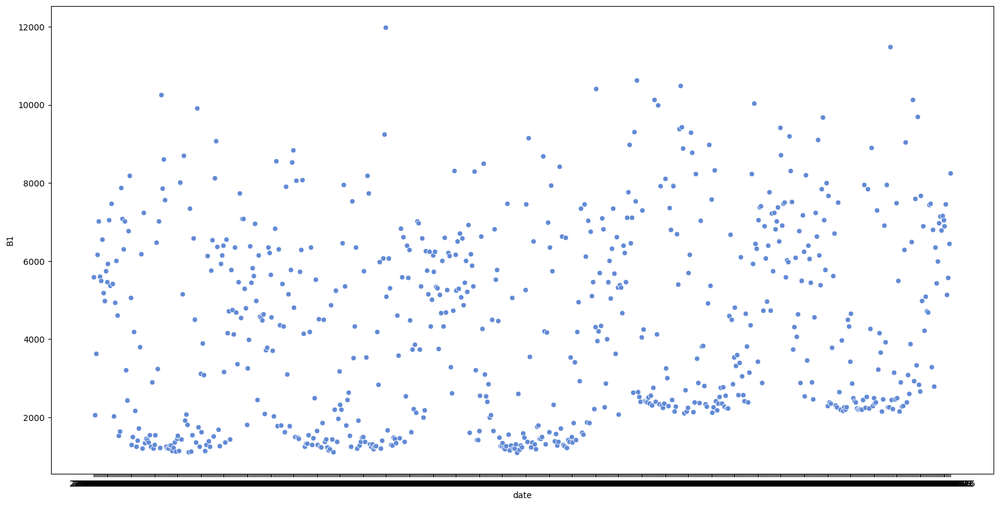

In [137]:
draw_plot('B1', 'Padvariu', new_df)


In [138]:
import os


def create_image(lake, interval, band, folder, points, pixel, moving_steps):
    results_dir = f'{folder}/{interval[0][:4]}'
    file_path = f'{results_dir}/{pixel}-{band}.png'
    # check if file exists
    if os.path.isfile(file_path):
        return
    df, _ = proceed(lake, interval, band, points, moving_steps)

    # make date column as YYYY-MM-DD x is string
    df['date'] = df['date'].apply(
        lambda x: parser.parse(x).strftime('%Y-%m-%d'))
    # date to string type
    df['date'] = df['date'].astype(str)
    # remove reducer column
    df = df.drop(columns=['reducer'])

    ax = draw_plot(band, pixel, df)
    if not os.path.isdir(results_dir):
        os.makedirs(results_dir)
    fig = ax.get_figure()
    # return fig
    fig.savefig(file_path, bbox_inches = 'tight')


def create_image_for_bands(lake, interval, bands, folder, points, pixel, moving_steps):
    for band in bands:
        create_image(lake, interval, band, folder, points, pixel, moving_steps)
        print(f'{i} {band} {interval[0]}')


In [139]:
from joblib import Parallel


# Pattern 'AOT', 'WVP', 'SCL' did not match any bands.
bands = ['B1', 'B5', 'B6', 'B7', 'B8', 'B8A',
         'B9', 'B11', 'B12']
# bands = ['B2', 'B3', 'B4']
intervals = [
    ['2019-01-01', '2023-12-31'],
    # ['2021-01-01', '2021-12-31'],
    # ['2022-01-01', '2022-12-31'],
    # ['2023-01-01', '2023-12-31'],
]

# change folder
# choose new lake # 0 - padvariu, 1 - arimaiciu, 2 - kauno, 3 - dusia, 4 - asveja
# change pixel and choose point X
# change pixel and choose point 2 


folder = '/Users/zygimantas/Documents/sources/geo/dataset_create'
lake = lakes.iloc[0]
pixel = 'in_lake'
# pixel = 'outside_lake'
points = [
    21.2562, 55.9294
    # 21.2426, 55.9290
]

moving_steps = 20

# Parallel(n_jobs=-1)(create_image_for_bands(lake, interval, bands, folder, points, pixel, moving_steps)
#                     for i, interval in enumerate(intervals))


TODO:
- prisideti std error
- band == bad, jei reiksme nepatenkka i error rezi

In [140]:
def create_and_group_data(lake, interval, band, folder, points, pixel, moving_steps):
    df, _ = proceed(lake, interval, band, points, moving_steps)

    # make date column as YYYY-MM-DD x is string
    df['date'] = df['date'].apply(
        lambda x: parser.parse(x).strftime('%Y-%m-%d'))
    # date to string type
    df['date'] = df['date'].astype(str)
    # remove reducer column
    df = df.drop(columns=['reducer'])

    # make date nan values that are outside the error range
    # df['date'] = np.where(df[band] > df['MM']*0.9 and df[band]
                        #   < df['MM']*1.1, df['date'], np.nan)
    # df = df[df[band] > df['MM']*0.9 and df[band] < df['MM']*1.1]
    return df


test_df = create_and_group_data(lakes.iloc[0], ['2019-01-01', '2023-12-31'], ['B1', 'B5', 'B6', 'B7', 'B8', 'B8A',
                                                                    'B9', 'B11', 'B12'], folder, points, pixel, moving_steps)
test_df

,B1,B11,B12,B5,B6,B7,B8,B8A,B9,date,...,system:time_start,MM_B1,MM_B5,MM_B6,MM_B7,MM_B8,MM_B8A,MM_B9,MM_B11,MM_B12
0,5730.0,5188.0,4242.0,6170.0,6390.0,6735.0,6799.0,7083.0,3808.0,2019-01-01,...,1546337098750,5750.0,5940.0,6111.5,6332.5,5985.0,6439.5,2195.0,2283.5,2082.5
1,5730.0,5189.0,4242.0,6171.0,6391.0,6737.0,6799.0,7082.0,3808.0,2019-01-01,...,1546337086880,5750.0,5940.0,6111.5,6332.5,5985.0,6439.5,2195.0,2283.5,2082.5
2,1955.0,131.0,70.0,543.0,491.0,450.0,376.0,335.0,206.0,2019-01-03,...,1546509308400,5750.0,5940.0,6111.5,6332.5,5985.0,6439.5,2195.0,2283.5,2082.5
3,1953.0,131.0,69.0,544.0,491.0,451.0,376.0,335.0,207.0,2019-01-03,...,1546509294240,5750.0,5940.0,6111.5,6332.5,5985.0,6439.5,2195.0,2283.5,2082.5
4,3593.0,3745.0,3100.0,3193.0,3590.0,3842.0,3645.0,4127.0,1914.0,2019-01-06,...,1546769103110,5750.0,5940.0,6111.5,6332.5,5985.0,6439.5,2195.0,2283.5,2082.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1457,6294.0,4353.0,3187.0,5978.0,6153.0,6243.0,6118.0,6331.0,3154.0,2023-12-21,...,1703153093710,6938.0,5970.0,6089.5,6193.0,5973.5,6289.5,2970.0,3522.5,3060.0
1458,6536.0,3185.0,2977.0,5853.0,5958.0,6066.0,5660.0,6096.0,3745.0,2023-12-23,...,1703325306970,6938.0,5962.0,6088.5,6180.0,5829.0,6289.5,3145.0,3522.5,3062.0
1459,6536.0,3185.0,2977.0,5853.0,5958.0,6066.0,5660.0,6096.0,3745.0,2023-12-23,...,1703325292809,6938.0,5935.5,6067.5,6173.0,5828.5,6289.5,3149.5,3522.5,3062.0
1460,7517.0,3858.0,3493.0,7764.0,7527.0,7316.0,8778.0,7085.0,5935.0,2023-12-26,...,1703585101594,6938.0,5962.0,6130.0,6180.0,5829.0,6289.5,3154.5,3522.5,3062.0


In [141]:

def preprocess(df: pd.DataFrame):
    cleaned_df = df.copy()
    d = {'date': [], 'count': []}
    # loop rows
    for i, row in cleaned_df.iterrows():
        # get date
        date = row['date']
        cols_to_remove = list(cleaned_df.filter(regex='MM'))
        # get bands
        bands = row.drop(['date', *cols_to_remove])

        count = 0
        # loop bands
        for band, value in bands.items():
            # if value is outside of the error range
            if value < row[f'MM_{band}']*error_range['lower'] or value > row[f'MM_{band}']*error_range['upper']:
                # set value to nan
                cleaned_df.at[i, band] = np.nan
                count += 1
        d['date'].append(date)
        d['count'].append(count)
    res_df = pd.DataFrame(d)
    return cleaned_df, res_df


cleaned_df, res_df = preprocess(test_df)
# get rows where res_df['count'] is 0
res_df, (res_df['count'] == 0).sum(), 'out of', len(res_df)

KeyError: 'MM_latitude'

/Users/zygimantas/miniforge3/envs/geo/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/zygimantas/miniforge3/envs/geo/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



<Axes: xlabel='count', ylabel='Count'>

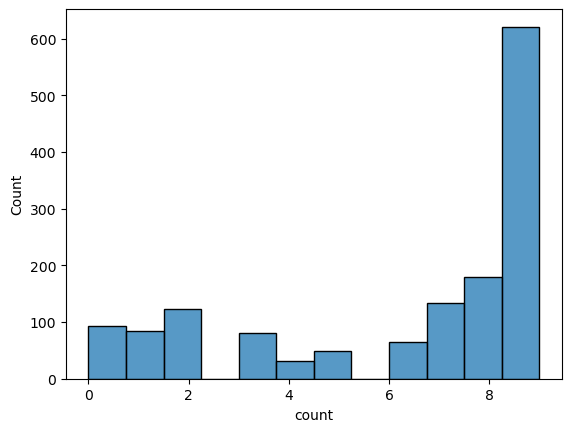

In [ ]:
# seaborn bar plot res_df['count']
plt = sns.histplot(data=res_df, x='count')
plt

In [ ]:
import plotly.express as px
fig = px.bar(res_df, x='date', y='count')

# line average
y_mean = res_df['count'].mean()
y_median = res_df['count'].median()
print(y_mean, y_median)
fig.add_hline(y=y_mean, line_width=3, line_dash="dash", line_color="red")
fig.add_hline(y=y_median, line_width=3, line_dash="dash", line_color="green")

fig

6.364383561643836 8.0


In [ ]:
# how much more items are filtered when filtering by median and mean
res_df[res_df['count'] < y_mean].count(), res_df[res_df['count'] < y_median].count()


(date     526
 count    526
 dtype: int64,
 date     659
 count    659
 dtype: int64)

In [ ]:
# extract only columns that are MM_ or latitude and longitude
test_df_1 = test_df.filter(regex='MM|latitude|longitude')
test_df_1
# test_df_1 to feature collection
fc = geemap.pandas_to_ee(test_df_1)
fc


In [161]:
def filter_data_by_median(lake):
    date_range = ['2019-01-01', '2023-12-31']
    bands = ['B1', 'B5', 'B6', 'B7', 'B8', 'B8A',
             'B9', 'B11', 'B12']
    points = [
        21.2562, 55.9294
        # 21.2426, 55.9290
    ]
    moving_steps = 20


    def preprocess(df: pd.DataFrame):
        # loop rows
        df['count'] = None
        for i, row in df.iterrows():
            count = 0
            # loop bands
            for band in bands:
                # if value is inside of the error range
                if row[band] >= row[f'MM_{band}']*error_range['lower'] and row[band] <= row[f'MM_{band}']*error_range['upper']:
                    count += 1

            df.at[i, 'count'] = count

        return df

    def add_count_band(image):
        # get count by system:time_start
        count = fc.filter(ee.Filter.eq('system:time_start', image.get(
            'system:time_start'))).first().get('count')
        # add count band to image
        return image.set('count', count)

    bounds = lake[cols.geometry].bounds
    maxx = bounds[2] + 0.01
    minx = bounds[0] - 0.01
    maxy = bounds[3] + 0.01
    miny = bounds[1] - 0.01
    bounds = ee.Geometry.Rectangle(
        minx, miny, maxx, maxy
    )

    df, coll = proceed(lake, date_range, bands, points, moving_steps)
    # count how many values are inside of the error range
    df = preprocess(df)
    df = df.filter(regex='count|latitude|longitude|system:time_start')
    fc = geemap.pandas_to_ee(df)

    # add count band to coll
    coll = coll.map(add_count_band)

    # filter if count band is bigger than 8
    new_coll = coll.filter(ee.Filter.gte('count', y_median))
    return new_coll


filter_data_by_median(lakes.iloc[0])

Name,Description
B1,Aerosols
B2,Blue
B3,Green
B4,Red
B5,Red Edge 1
B6,Red Edge 2
B7,Red Edge 3
B8,NIR
B8A,Red Edge 4
B9,Water vapor
